# TODO
    -> add in fits processing a save of png files with transformations to make LSB galaxies pop up.
       ^ maybe do this after aplying the filter? LSBs might be more visible then

# Imports

In [1]:
import pandas as pd
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
import glob
from sklearn.cluster import DBSCAN
from mask import get_mask
from img_processing import fits_processing
from utils import download_fields
from config import IMAGES_DIR

# Download Data

In [2]:
download_fields()

establishing connection to splus ...
Login: welberth
Password: ········
You have access to internal data


100%|█████████████████████████████████████████████| 2/2 [01:07<00:00, 33.90s/it]


# Image Processing

In [2]:
fits_processing(Q = 8, stretch = 3)

100%|█████████████████████████████████████████████| 2/2 [00:41<00:00, 20.82s/it]


# Load Images

In [8]:
files = glob.glob(IMAGES_DIR+"*")
data = [np.load(file)['img'] for file in files]

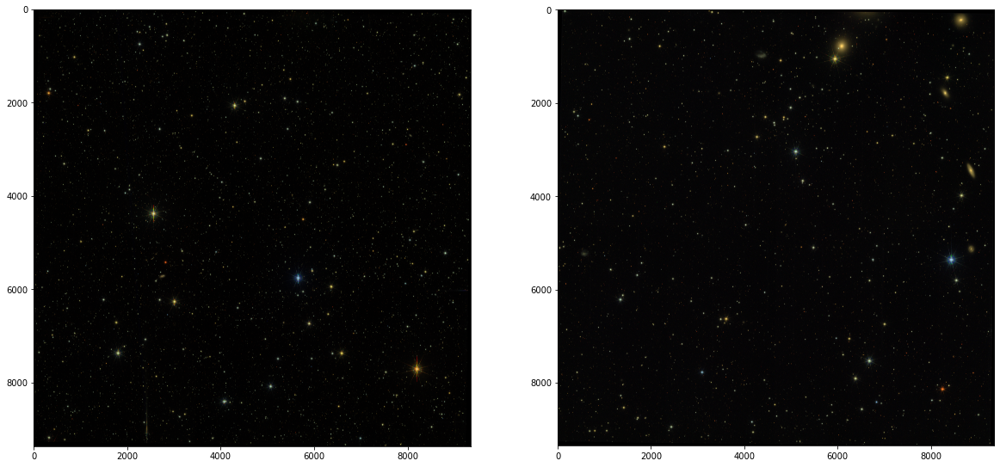

In [9]:
fig,ax = plt.subplots(1,2,figsize=(20,10))
for i in range(2):
    ax[i].imshow(data[i])

# Mask

In [10]:
mask = get_mask(data[1][:,:,0],pixel_threshold=200)

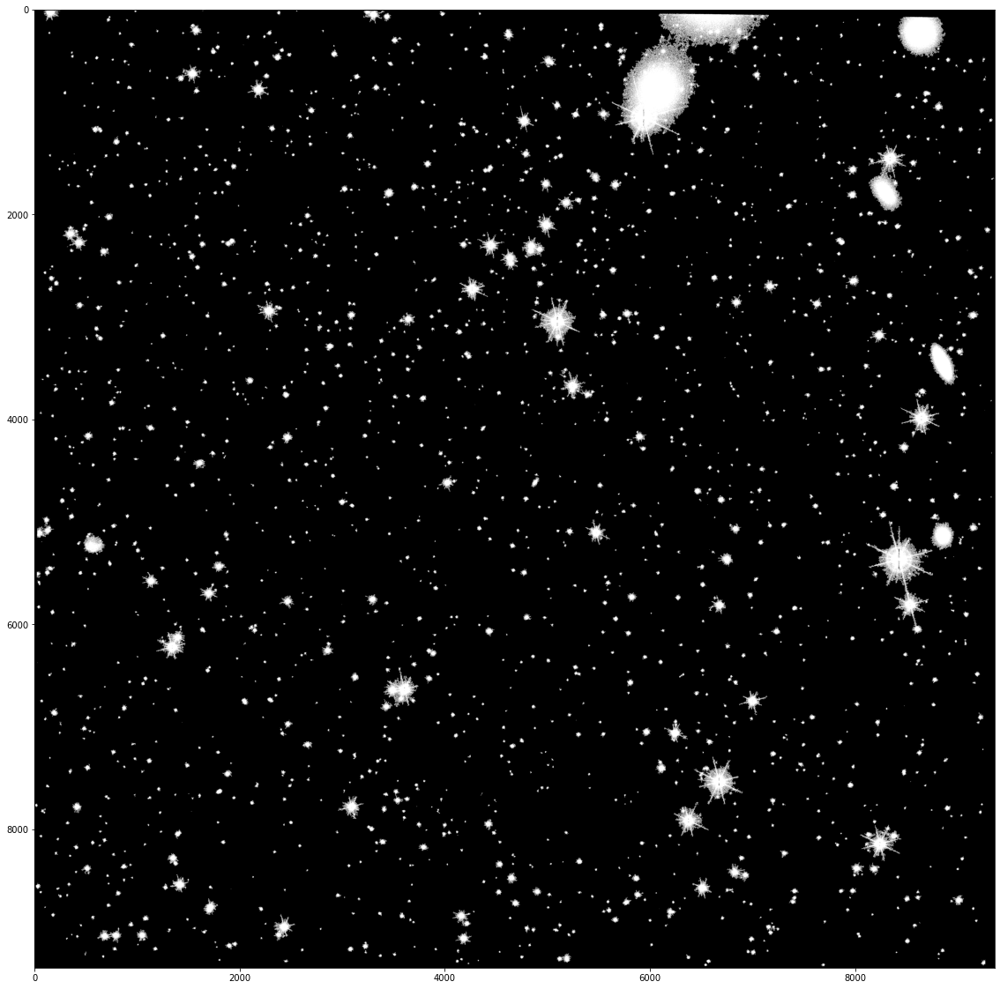

In [11]:
fig,ax = plt.subplots(figsize=(20,20))
plt.imshow(mask, cmap='gray_r');
plt.imsave(fname='data/images/SPLUS-s28s34_mask.png', arr=mask, cmap='gray_r', format='png')

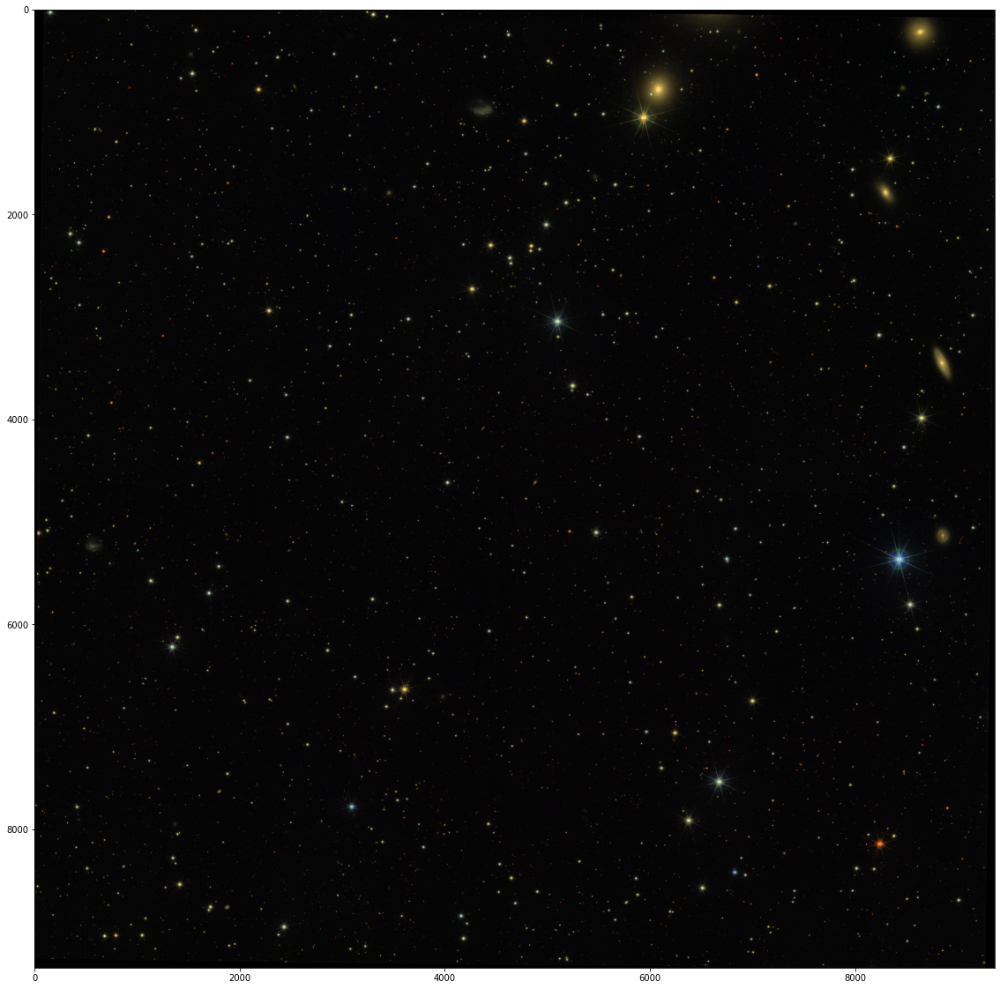

In [16]:
fig,ax = plt.subplots(figsize=(20,20))
plt.imshow(data[1]);
plt.imsave(fname='data/images/SPLUS-s28s34_band_r.png', arr=data[1][:,:,1], cmap='gray_r', format='png')

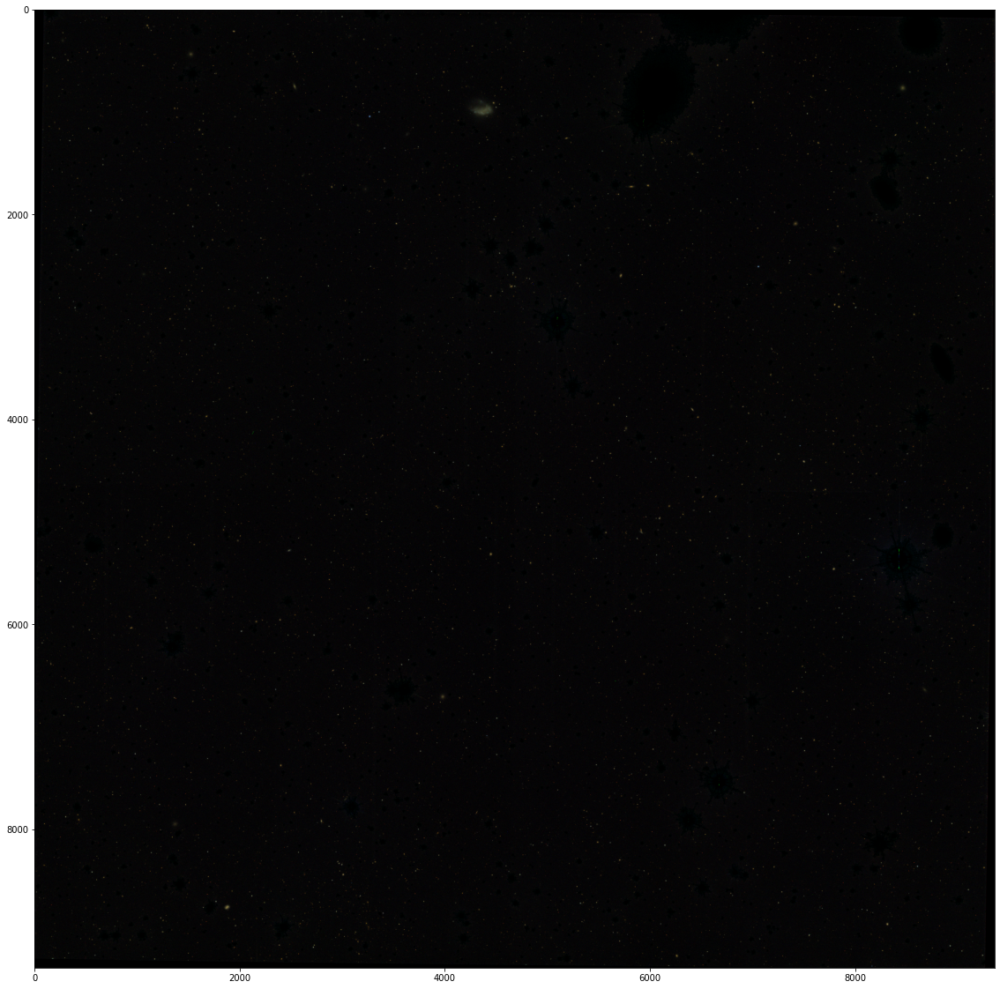

In [15]:
fig,ax = plt.subplots(figsize=(20,20))
masked_data = data[1]*np.dstack([mask]*3)
plt.imshow(masked_data);
plt.imsave(fname='data/images/SPLUS-s28s34_band_r_masked.png', arr=data[1][:,:,1]*mask, cmap='gray_r', format='png')

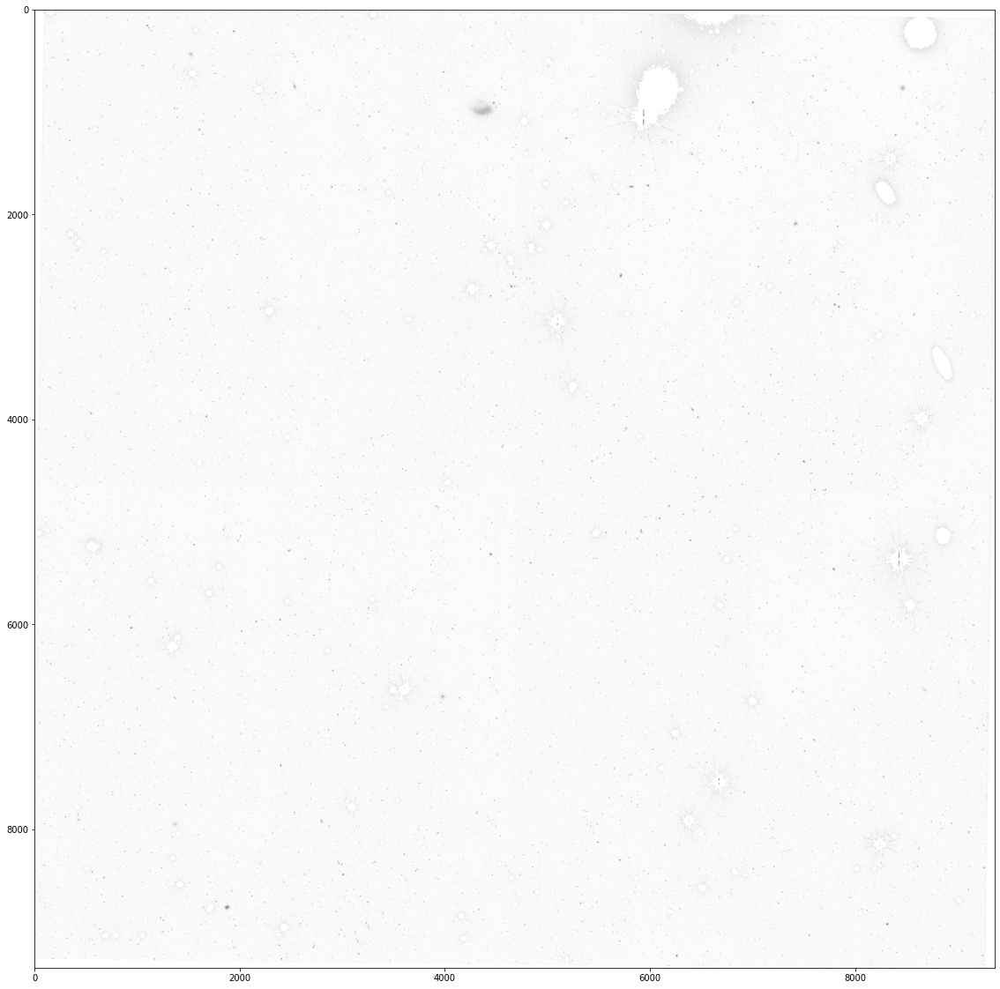

In [424]:
fig,ax = plt.subplots(figsize=(20,20))
masked_data = data[1]*np.dstack([mask]*3)
plt.imshow(band_r*mask, cmap='gray_r');

# Coordinates Mess

In [13]:
def get_flags(file_path:str)->pd.DataFrame:
    col_list = ['ID','RA','DEC', 'BrightstarFlag']
    return pd.read_csv(file_path, usecols=col_list)

In [57]:
flags = get_flags("data/flags/SPLUS-s28s34_matches_masks_zspec.csv")
saturated = flags.query("BrightstarFlag == 2")

In [58]:
import astropy.wcs as wcs
from astropy.coordinates import SkyCoord
from astropy import units as u
f = fits.open('data/fits/SPLUS-s28s34_bands_RGI.fits')
w = wcs.WCS(f[0].header).dropaxis(2)

In [59]:
#Saturated objects
c_s = {}
for i in range(saturated.shape[0]):
    c_s[i] = SkyCoord(ra = saturated['RA'].values[i]*u.degree, dec = saturated['DEC'].values[i]*u.degree)

In [60]:
positions_s = np.zeros((saturated.shape[0], 2))
for i in range(saturated.shape[0]):
    positions_s[i] = w.world_to_pixel(c_s[i])

In [61]:
#Saving the saturated objects
d = np.array([positions_s[:, 0], positions_s[:, 1]]).T
columns = ['x', 'y']
df = pd.DataFrame(data = d, columns = columns)

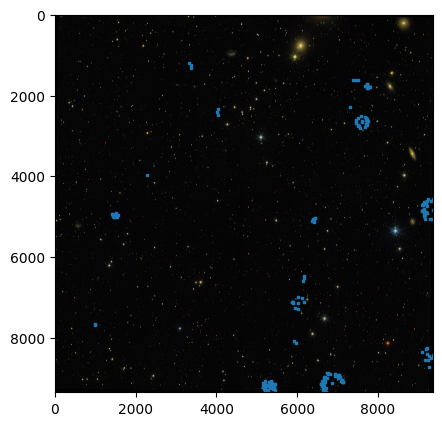

In [74]:
#Visualizing the saturated objects and its insiders
plt.figure(dpi = 100, figsize = (5, 5))
plt.scatter(positions_s[:, 0], positions_s[:, 1], marker = 's', s = 1, label = 'Saturated')
plt.imshow(data[1])

In [37]:
xp = positions_s[:, 0]
yp = positions_s[:, 1]

In [39]:
positions_s

array([[3176.4030639 ,  900.19398785],
       [3097.1229087 ,  903.44066725],
       [3044.54524447,  903.71983053],
       ...,
       [ 988.48015779, 7643.06338338],
       [1314.16739924, 7643.00304582],
       [5899.69027518, 7648.79351712]])

In [63]:
mask = np.histogram2d(xp, yp, bins = 190)[0]

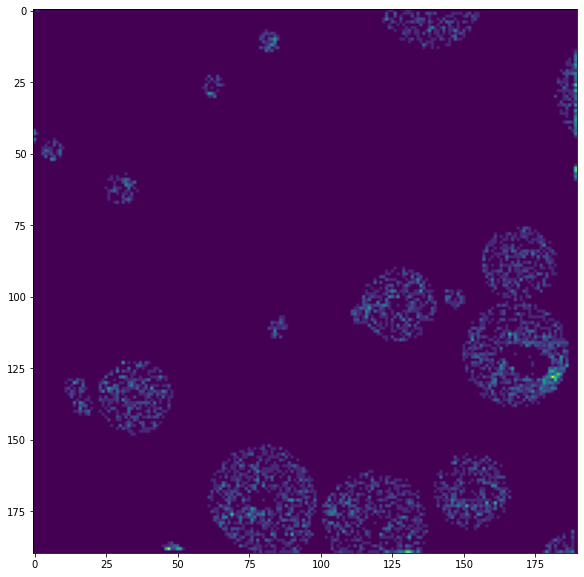

In [64]:
fig,ax = plt.subplots(figsize=(10,10))
plt.imshow(mask)

In [67]:
mask_res = cv.resize(mask, dsize=(10000, 10000), interpolation=cv.INTER_CUBIC)

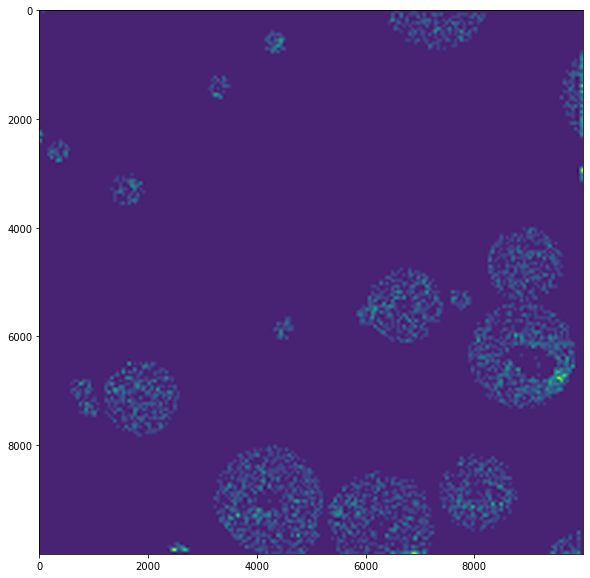

In [68]:
fig,ax = plt.subplots(figsize=(10,10))
plt.imshow(mask_res)

In [70]:
#It different object receives a label/value
labels, numobjects = scipy.ndimage.label(mask_res)

#Changing all nonzero values to one, to build the mask
original_mask = np.copy(labels)
original_mask[np.where(original_mask > 0)] = 1

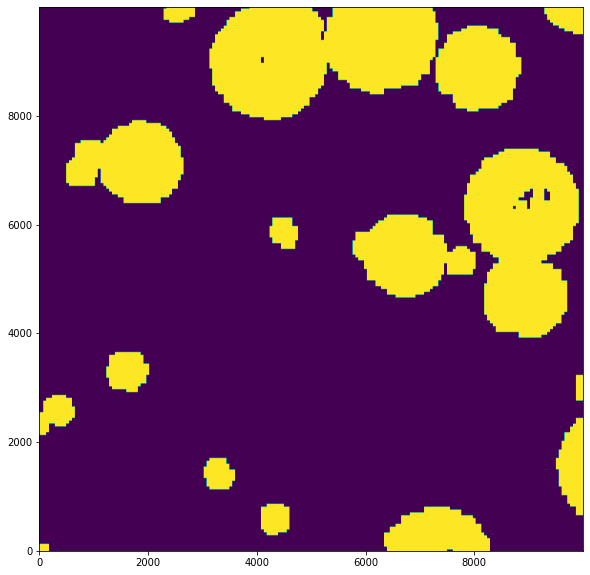

In [71]:
fig,ax = plt.subplots(figsize=(10,10))
plt.imshow(original_mask, origin='lower')

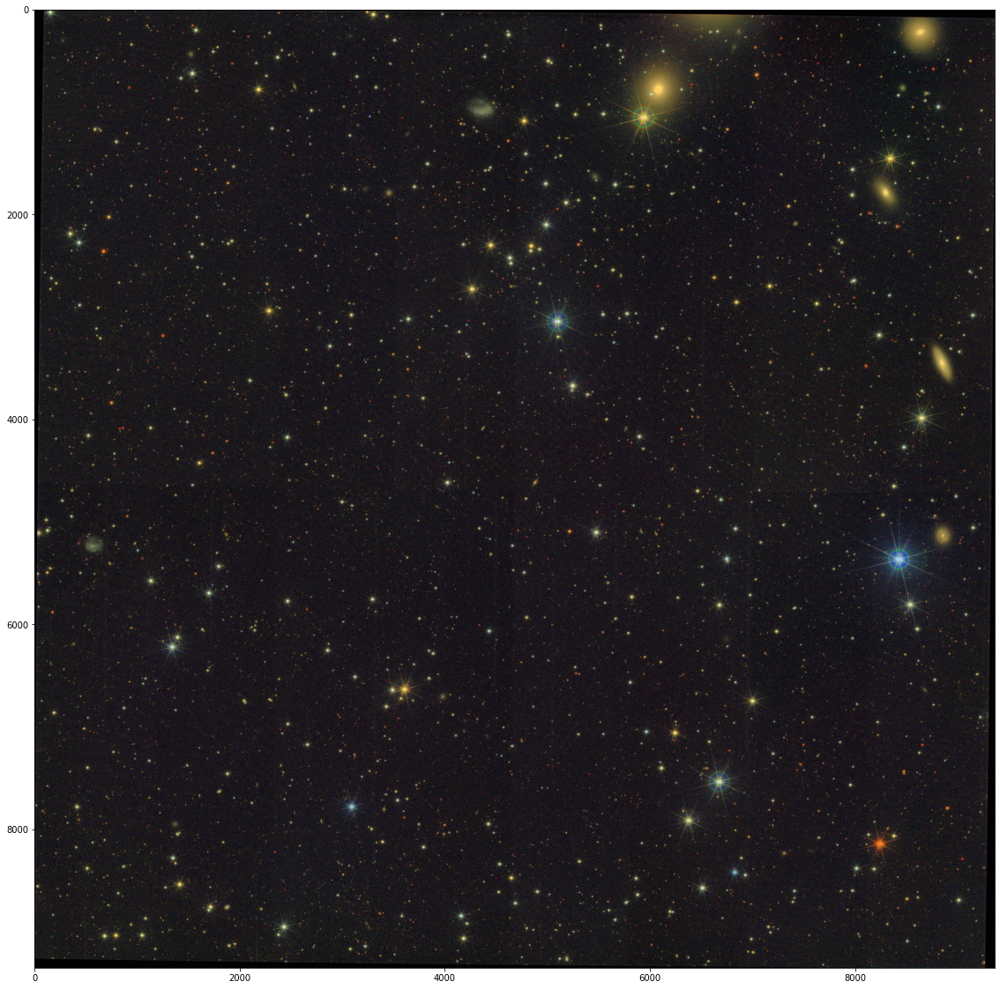

In [5]:
fig,ax = plt.subplots(figsize=(20,20))
plt.imshow(data[1])
#plt.imsave(fname='fornax.png', arr=data[1], cmap='gray_r', format='png')

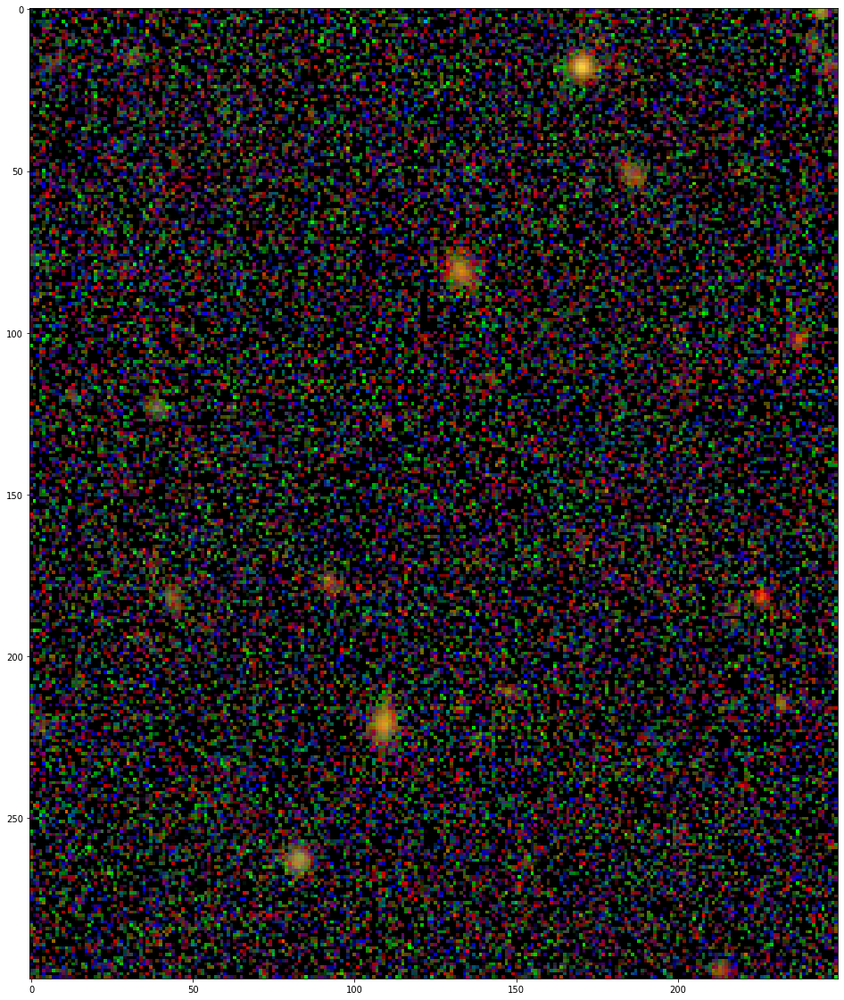

In [6]:
fig,ax = plt.subplots(figsize=(20,20))
plt.imshow(data[1][3300:3600,1500:1750])